In [1]:
!pip install tensorflow-decision-forests

In [2]:
import tensorflow as tf
import tensorflow_decision_forests as tfdf
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# **1. Data Preprocessing**


Handle Missing Values: Identify and fill or drop missing values.
Transform Categorical Variables: Convert categorical variables into numerical values using techniques like one-hot encoding.
Remove Outliers: Detect and remove outliers that could skew the model.

### **1.1 Load the Data:** Import the training and test datasets.



In [2]:
train_file_path = "train.csv"
dataset_df = pd.read_csv(train_file_path)
print("Full train dataset shape is {}".format(dataset_df.shape))

Full train dataset shape is (1460, 81)


In [5]:
test_file_path = "test.csv"
dataset_test = pd.read_csv(test_file_path)
print("Full test dataset shape is {}".format(dataset_test.shape))

Full test dataset shape is (1459, 80)


- The data is composed of 81 columns and 1460 entries in train
dataset

- The data is composed of 80 columns and 1459 entries in train dataset

In [6]:
dataset_df.head(3)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


There are 79 feature columns. Using these features your model has to predict the house sale price indicated by the label column named SalePrice.

drop the Id column as it is not necessary for model training.

In [7]:
dataset_df = dataset_df.drop('Id', axis=1)
dataset_df.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [8]:
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

### **1.2 Handle Missing Values:** Identify and fill or drop missing values.

In [9]:
# drop duplicates
dataset_df.drop_duplicates().shape[0] == dataset_df.shape[0]

True

In [10]:

null_counts = dataset_df.isnull().sum()
null_percentage = (dataset_df.isnull().sum() * 100) / len(dataset_df)

# Combine the results into a single DataFrame
null_stats = pd.DataFrame({
    'Null Count': null_counts,
    'Percentage': null_percentage
})

null_stats.head(80)

,Null Count,Percentage
MSSubClass,0,0.000000
MSZoning,0,0.000000
LotFrontage,259,17.739726
LotArea,0,0.000000
Street,0,0.000000
...,...,...
MoSold,0,0.000000
YrSold,0,0.000000
SaleType,0,0.000000
SaleCondition,0,0.000000


In [11]:
# Select columns with more than 15% null values
columns_with_high_nulls = null_stats[null_stats['Percentage'] > 15].index.tolist()
print(columns_with_high_nulls)

['LotFrontage', 'Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']


In [12]:
# Drop the selected columns from the DataFrame
dataset_df.drop(columns=columns_with_high_nulls, inplace=True)

In [13]:

null_counts = dataset_df.isnull().sum()
null_percentage = (dataset_df.isnull().sum() * 100) / len(dataset_df)

null_stats = pd.DataFrame({
    'Null Count': null_counts,
    'Percentage': null_percentage
})

null_stats.head(80)

,Null Count,Percentage
MSSubClass,0,0.0
MSZoning,0,0.0
LotArea,0,0.0
Street,0,0.0
LotShape,0,0.0
...,...,...
MoSold,0,0.0
YrSold,0,0.0
SaleType,0,0.0
SaleCondition,0,0.0


In [14]:
# Drop rows with any null values
dataset_df.dropna(inplace=True)

In [15]:
dataset_df.shape

(1338, 73)

In [16]:
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1338 entries, 0 to 1459
Data columns (total 73 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1338 non-null   int64  
 1   MSZoning       1338 non-null   object 
 2   LotArea        1338 non-null   int64  
 3   Street         1338 non-null   object 
 4   LotShape       1338 non-null   object 
 5   LandContour    1338 non-null   object 
 6   Utilities      1338 non-null   object 
 7   LotConfig      1338 non-null   object 
 8   LandSlope      1338 non-null   object 
 9   Neighborhood   1338 non-null   object 
 10  Condition1     1338 non-null   object 
 11  Condition2     1338 non-null   object 
 12  BldgType       1338 non-null   object 
 13  HouseStyle     1338 non-null   object 
 14  OverallQual    1338 non-null   int64  
 15  OverallCond    1338 non-null   int64  
 16  YearBuilt      1338 non-null   int64  
 17  YearRemodAdd   1338 non-null   int64  
 18  RoofStyle    

In [17]:
# Count unique values in each column
unique_counts = dataset_df.nunique()

single_unique_columns = unique_counts[unique_counts == 1].index

print("Columns with only one unique value:", list(single_unique_columns))

Columns with only one unique value: []


# **2. Exploratory Data Analysis (EDA)**


**2.1 Visualize Data:** Use plots to understand the distribution of variables and relationships between them.

**House Price Distribution**
Now let us take a look at how the house prices are distributed.

count      1338.000000
mean     186761.782511
std       78913.847668
min       35311.000000
25%      135000.000000
50%      168500.000000
75%      220000.000000
max      755000.000000
Name: SalePrice, dtype: float64


C:\Users\User\AppData\Local\Temp\ipykernel_34596\3430012634.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset_df['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});


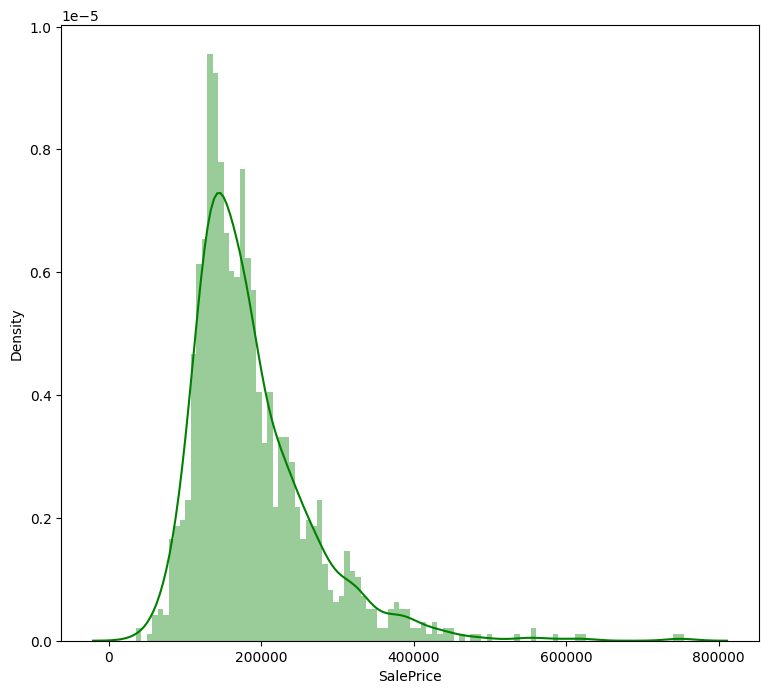

In [18]:
print(dataset_df['SalePrice'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(dataset_df['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});

#### **Numerical data distribution**
We will now take a look at how the numerical features are distributed. In order to do this, let us first list all the types of data from our dataset and select only the numerical ones.

In [19]:
list(set(dataset_df.dtypes.tolist()))

[dtype('O'), dtype('int64'), dtype('float64')]

In [20]:
df_num = dataset_df.select_dtypes(include = ['float64', 'int64'])
df_num.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,196.0,706,0,150,...,0,61,0,0,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,0.0,978,0,284,...,298,0,0,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,162.0,486,0,434,...,0,42,0,0,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,0.0,216,0,540,...,0,35,272,0,0,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,350.0,655,0,490,...,192,84,0,0,0,0,0,12,2008,250000


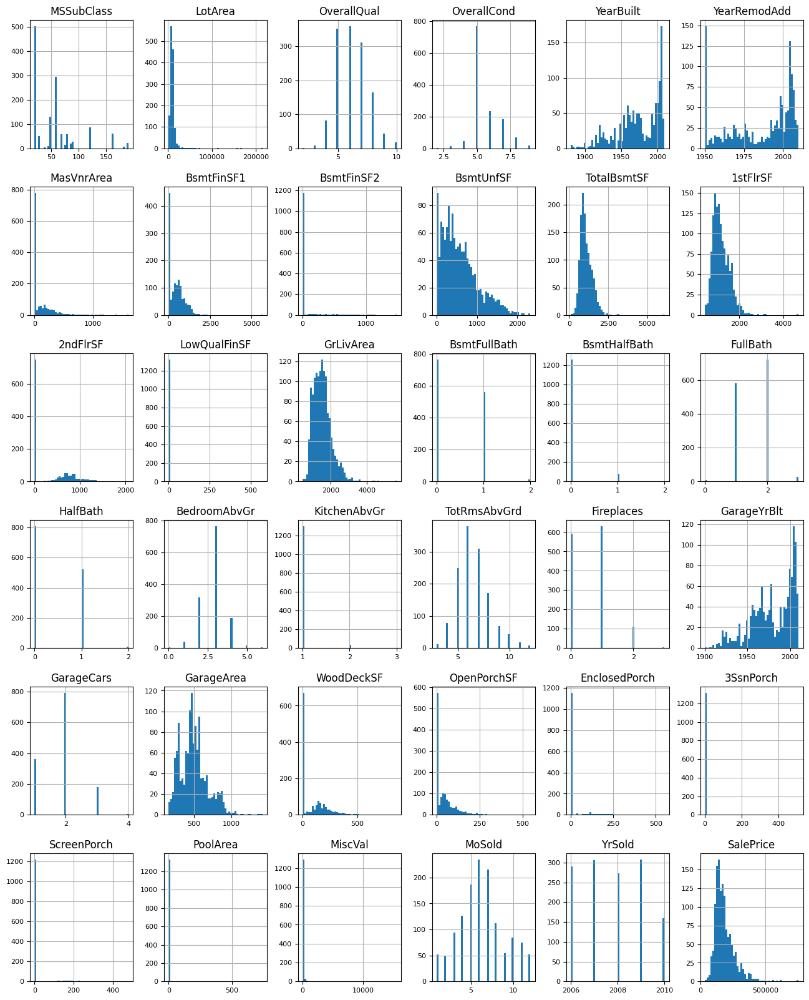

In [21]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

### **Categorical data distribution**

In [22]:
df_cat= dataset_df.select_dtypes(include = ['O'])
df_cat.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


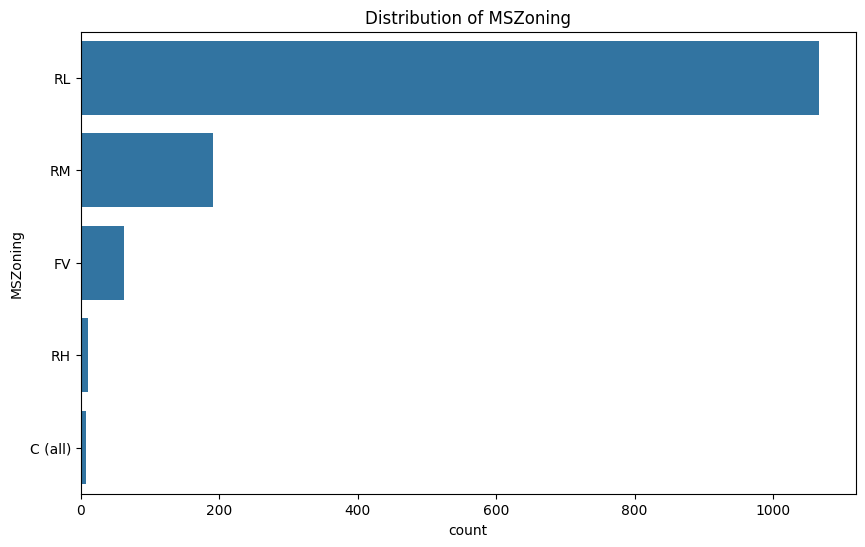

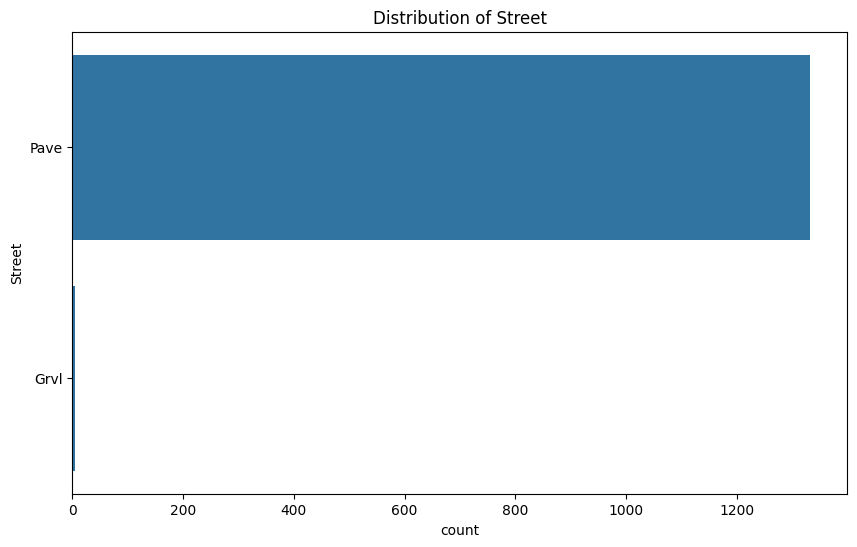

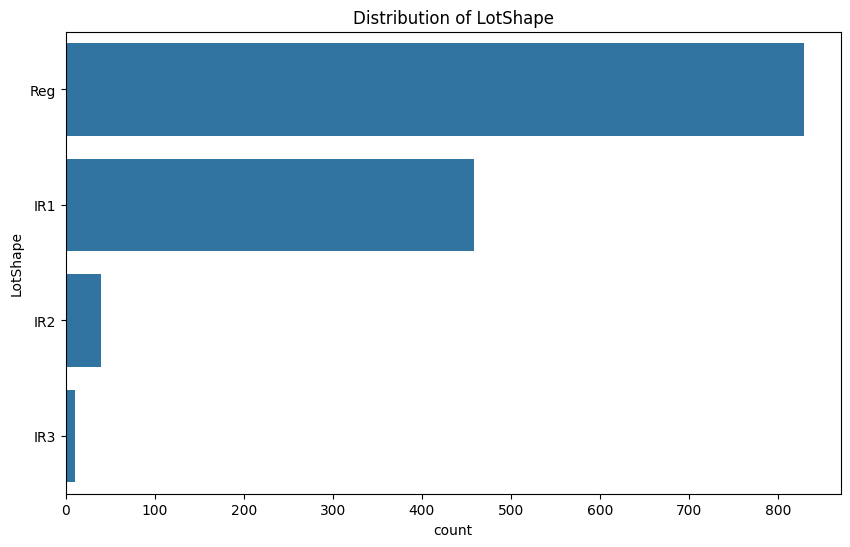

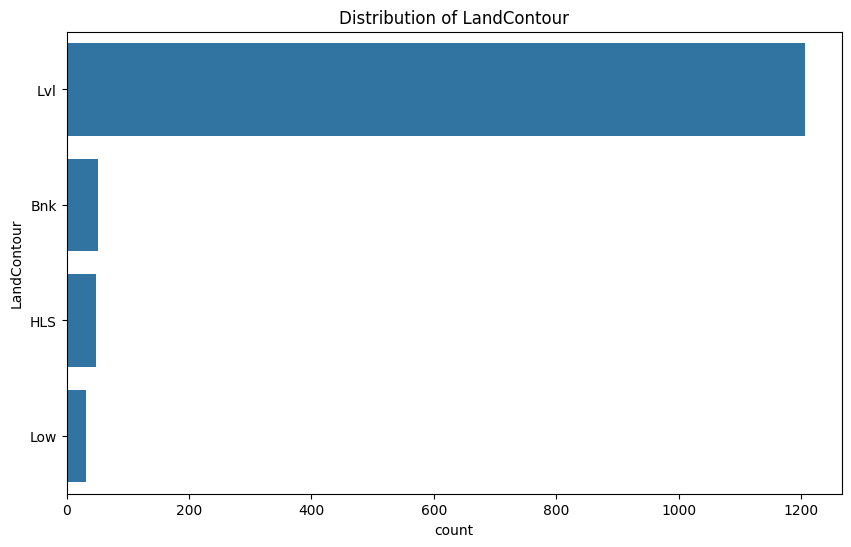

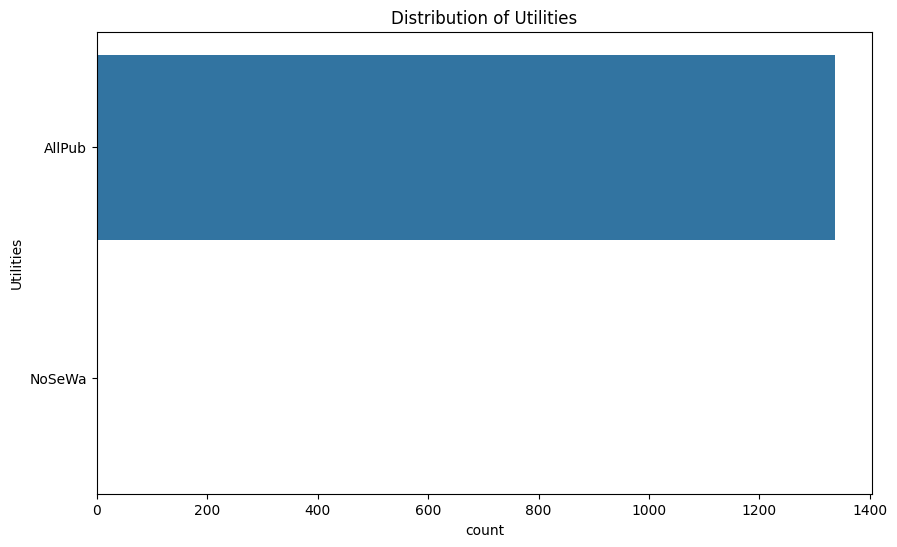

...

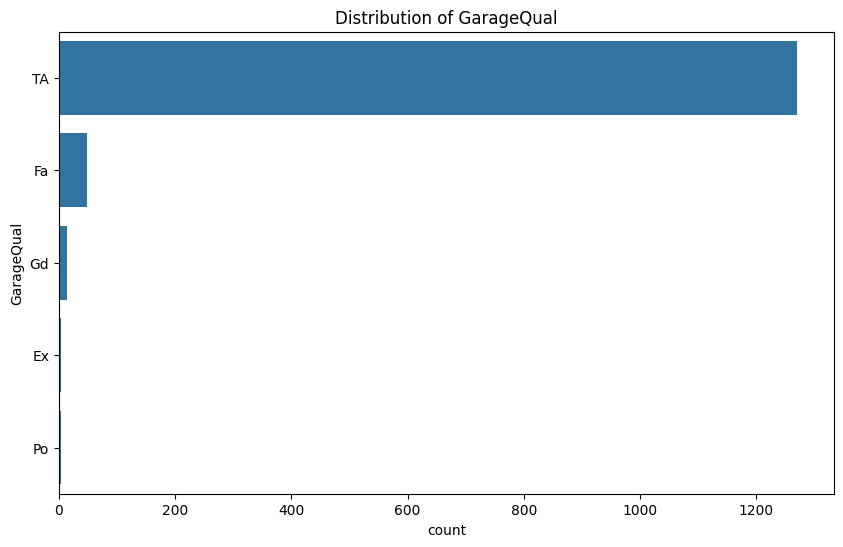

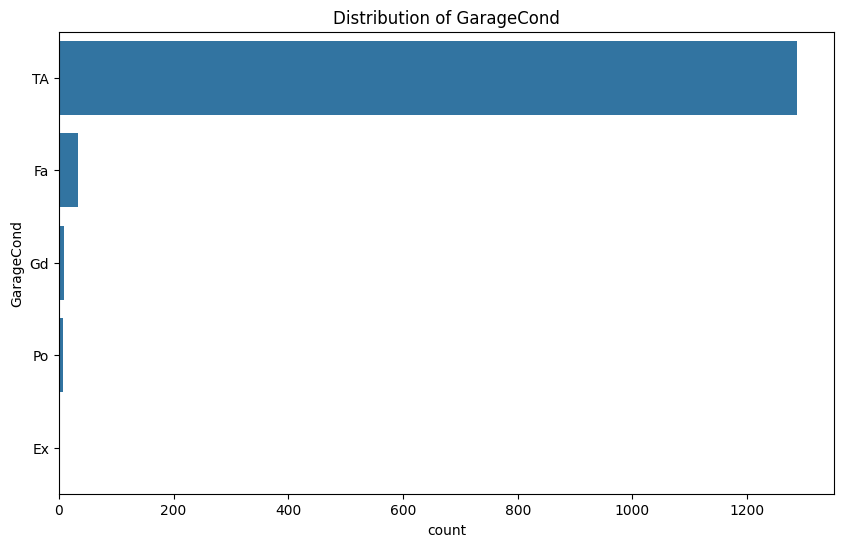

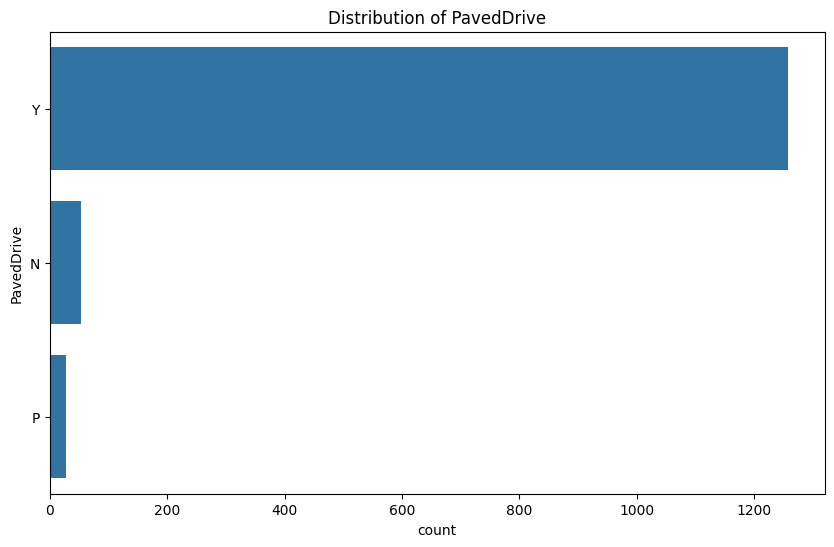

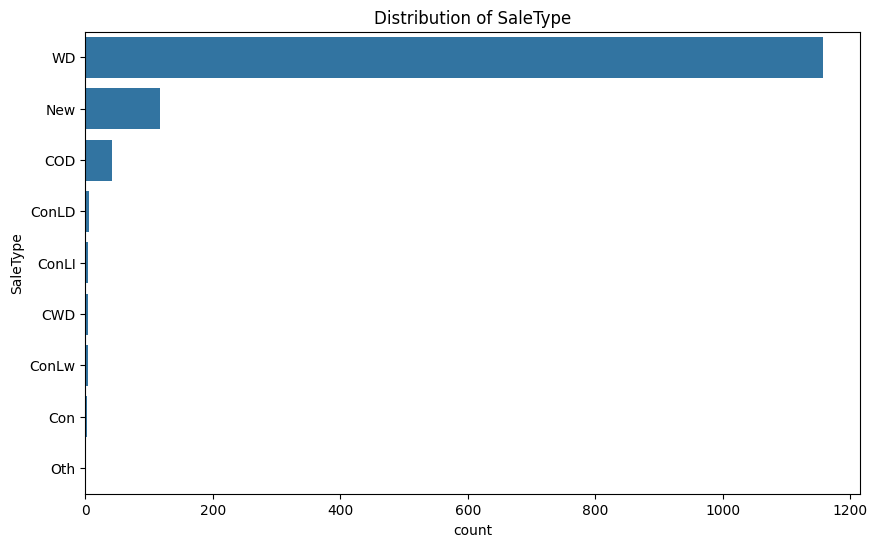

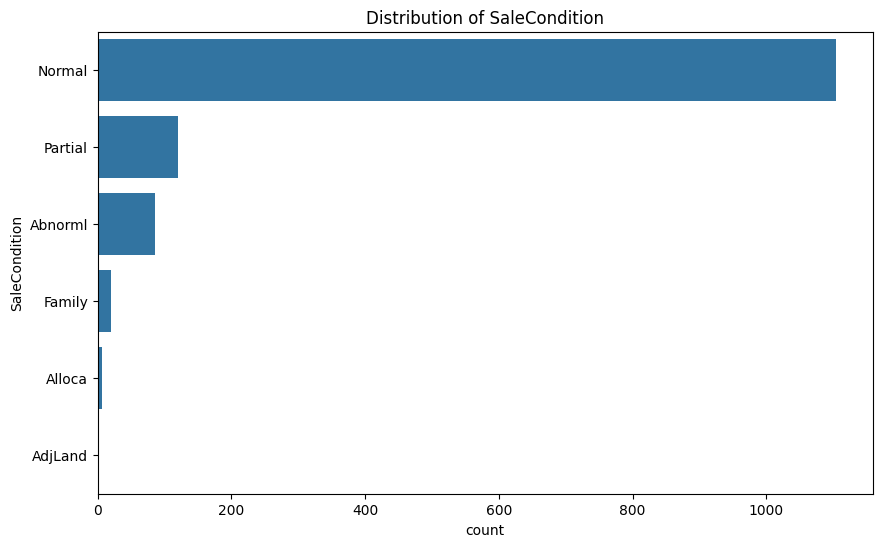

In [23]:
for column in df_cat.columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=column, data=df_cat, order=df_cat[column].value_counts().index)
    plt.title(f'Distribution of {column}')
    plt.show()

### **2.2 Correlation Analysis:** Identify which features are most correlated with the target variable (SalePrice).

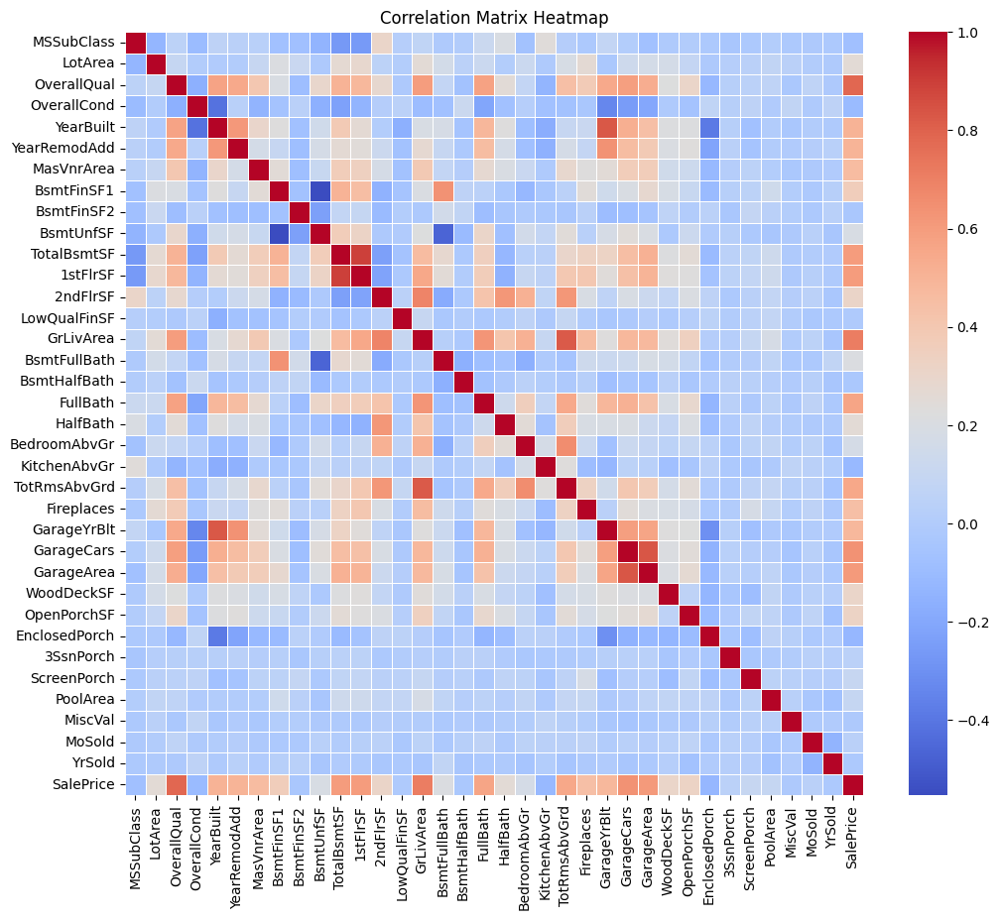

In [24]:

plt.figure(figsize=(12, 10))
correlation_matrix = df_num.corr()
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [25]:
correlation_matrix

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.134158,0.051690,-0.098153,0.056456,0.038513,0.031333,-0.069053,-0.079329,-0.141025,...,-0.010175,-0.000359,-0.022598,-0.041391,-0.022748,0.010199,-0.021512,-0.016283,-0.021591,-0.079599
LotArea,-0.134158,1.000000,0.090451,0.001415,-0.005022,0.001681,0.096727,0.210148,0.110493,-0.014589,...,0.167822,0.084942,-0.017968,0.019326,0.038489,0.077050,0.040824,0.000118,-0.012066,0.254757
OverallQual,0.051690,0.090451,1.000000,-0.163080,0.570668,0.549460,0.401175,0.197441,-0.086014,0.292940,...,0.218570,0.307615,-0.116931,0.026470,0.045257,0.064570,-0.029351,0.062641,-0.013949,0.783546
OverallCond,-0.098153,0.001415,-0.163080,1.000000,-0.417330,0.035076,-0.141080,-0.060068,0.035698,-0.161038,...,-0.012947,-0.060429,0.071473,0.023789,0.053759,-0.003544,0.077314,-0.011772,0.056340,-0.108627
YearBuilt,0.056456,-0.005022,0.570668,-0.417330,1.000000,0.617156,0.299410,0.224264,-0.070403,0.147762,...,0.212296,0.216793,-0.385415,0.028982,-0.070809,0.001006,-0.033493,0.004396,-0.007898,0.504297
YearRemodAdd,0.038513,0.001681,0.549460,0.035076,0.617156,1.000000,0.168311,0.099681,-0.085268,0.171881,...,0.201057,0.231129,-0.218452,0.039422,-0.052513,0.003354,-0.001379,0.014552,0.034503,0.501435
MasVnrArea,0.031333,0.096727,0.401175,-0.141080,0.299410,0.168311,1.000000,0.253015,-0.083303,0.104662,...,0.149182,0.129015,-0.112225,0.015221,0.052474,0.009334,-0.028975,-0.013461,-0.001521,0.465811
BsmtFinSF1,-0.069053,0.210148,0.197441,-0.060068,0.224264,0.099681,0.253015,1.000000,-0.064855,-0.552809,...,0.187178,0.107561,-0.105669,0.026811,0.051906,0.142708,0.007869,-0.021242,0.023958,0.359677
BsmtFinSF2,-0.079329,0.110493,-0.086014,0.035698,-0.070403,-0.085268,-0.083303,-0.064855,1.000000,-0.233449,...,0.061206,0.004211,0.045668,-0.031475,0.085865,0.041148,0.006246,-0.022039,0.032855,-0.031226
BsmtUnfSF,-0.141025,-0.014589,0.292940,-0.161038,0.147762,0.171881,0.104662,-0.552809,-0.233449,1.000000,...,-0.020711,0.122171,-0.003372,0.023701,-0.023065,-0.039315,-0.018566,0.031202,-0.039076,0.191689


In [26]:
target_correlation = correlation_matrix['SalePrice']
sorted_correlation = target_correlation.sort_values(ascending=False)
print("Features most correlated with SalePrice:\n", sorted_correlation)

Features most correlated with SalePrice:
 SalePrice        1.000000
OverallQual      0.783546
GrLivArea        0.711706
GarageCars       0.640154
GarageArea       0.607535
1stFlrSF         0.604714
TotalBsmtSF      0.602042
FullBath         0.569313
TotRmsAbvGrd     0.551821
YearBuilt        0.504297
YearRemodAdd     0.501435
GarageYrBlt      0.481730
MasVnrArea       0.465811
Fireplaces       0.445434
BsmtFinSF1       0.359677
OpenPorchSF      0.322786
2ndFlrSF         0.311354
WoodDeckSF       0.305983
HalfBath         0.258175
LotArea          0.254757
BsmtFullBath     0.209695
BsmtUnfSF        0.191689
BedroomAbvGr     0.169266
ScreenPorch      0.096624
PoolArea         0.091881
3SsnPorch        0.042159
MoSold           0.041310
LowQualFinSF    -0.009992
MiscVal         -0.016990
YrSold          -0.020451
BsmtHalfBath    -0.030175
BsmtFinSF2      -0.031226
MSSubClass      -0.079599
OverallCond     -0.108627
KitchenAbvGr    -0.111408
EnclosedPorch   -0.127385
Name: SalePrice, dtype


- **Positive Correlation:** Features with high positive correlation values (close to 1) are strongly positively correlated with SalePrice.
- **Negative Correlation:** Features with high negative correlation values (close to -1) are strongly negatively correlated with SalePrice.
- **Weak Correlation:** Features with correlation values close to 0 have little to no linear relationship with SalePrice.

In [27]:
sns.pairplot(df_num)
plt.show()

# **3.Prepare the dataset**
TF-DF stands for TensorFlow Decision Forests. It's a library in TensorFlow that allows you to build, train, and evaluate decision forest models like Random Forests and Gradient Boosted Trees. The key advantage of TF-DF is that it natively supports different types of data—numeric, categorical, and even missing features—without needing extensive preprocessing.

In [26]:
import numpy as np

def split_dataset(dataset, test_ratio=0.30):
  test_indices = np.random.rand(len(dataset)) < test_ratio
  return dataset[~test_indices], dataset[test_indices]

train_ds_pd, valid_ds_pd = split_dataset(dataset_df)
print("{} examples in training, {} examples in testing.".format(
    len(train_ds_pd), len(valid_ds_pd)))

943 examples in training, 395 examples in testing.


There's one more step required before we can train the model. We need to convert the datatset from Pandas format (pd.DataFrame) into TensorFlow Datasets format (tf.data.Dataset).


# **3. Modeling**

The Random Forest Model is set up by default for classification tasks. However, since we're dealing with a regression problem, we need to specify the task type as tfdf.keras.Task.REGRESSION in the parameters.

In [27]:
label = 'SalePrice'
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(train_ds_pd, label=label, task = tfdf.keras.Task.REGRESSION)
valid_ds = tfdf.keras.pd_dataframe_to_tf_dataset(valid_ds_pd, label=label, task = tfdf.keras.Task.REGRESSION)

### **Select a Model**
There are several tree-based models

- RandomForestModel
- GradientBoostedTreesModel
- CartModel
- DistributedGradientBoostedTreesModel

In [28]:
tfdf.keras.get_all_models()

[tensorflow_decision_forests.keras.RandomForestModel,
 tensorflow_decision_forests.keras.GradientBoostedTreesModel,
 tensorflow_decision_forests.keras.CartModel,
 tensorflow_decision_forests.keras.DistributedGradientBoostedTreesModel]

TensorFlow Decision Forests is a collection of state-of-the-art algorithms of Decision Forest models that are compatible with Keras APIs. The models include Random Forests, Gradient Boosted Trees, and CART, and can be used for regression, classification, and ranking task.

**select a template and/or set parameters**

In [29]:
rf = tfdf.keras.RandomForestModel(hyperparameter_template="benchmark_rank1", task=tfdf.keras.Task.REGRESSION)

Resolve hyper-parameter template "benchmark_rank1" to "benchmark_rank1@v1" -> {'winner_take_all': True, 'categorical_algorithm': 'RANDOM', 'split_axis': 'SPARSE_OBLIQUE', 'sparse_oblique_normalization': 'MIN_MAX', 'sparse_oblique_num_projections_exponent': 1.0}.
Use /tmp/tmp1ecn6m_w as temporary training directory


### **Random Forest**
 use the defaults to create the Random Forest Model while specifiyng the task type as tfdf.keras.Task.REGRESSION.

In [30]:
rf = tfdf.keras.RandomForestModel(task = tfdf.keras.Task.REGRESSION)
rf.compile(metrics=["mse"])

Use /tmp/tmp23d_jcwq as temporary training directory


**Train the model**

In [31]:
rf.fit(x=train_ds)

Reading training dataset...
Training dataset read in 0:00:09.654955. Found 943 examples.
Training model...
Model trained in 0:00:02.224088
Compiling model...
Model compiled.


The default number of trees used in the Random Forests is 300. We can select a tree to display below.

In [32]:
tfdf.model_plotter.plot_model_in_colab(rf, tree_idx=0, max_depth=4)

# **4. Model Evaluation**

**Root mean square error (RMSE)** is widely used as a performance measure in continuous motion prediction. It measures the average difference of the actual data points from the predicted values, and the difference is squared to avoid the cancelation of positive and negative values, while they are summed up.

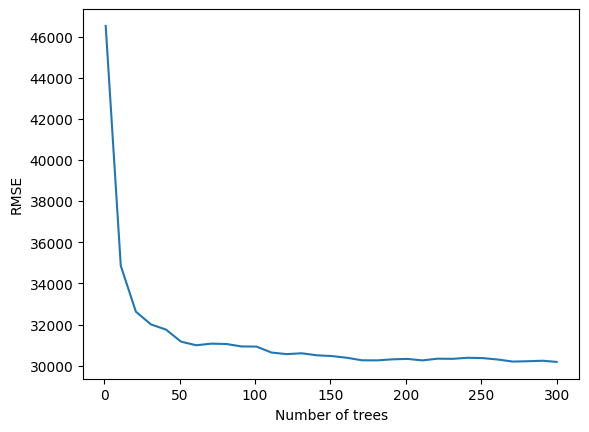

In [33]:
import matplotlib.pyplot as plt
logs = rf.make_inspector().training_logs()
plt.plot([log.num_trees for log in logs], [log.evaluation.rmse for log in logs])
plt.xlabel("Number of trees")
plt.ylabel("RMSE")
plt.show()

**evaluation using the validation dataset.**

In [34]:
evaluation = rf.evaluate(x=valid_ds,return_dict=True)

for name, value in evaluation.items():
  print(f"{name}: {value:.4f}")

1/1 [==============================] - 2s 2s/step - loss: 0.0000e+00 - mse: 870910336.0000
loss: 0.0000
mse: 870910336.0000


## **Submission**

In [35]:
test_file_path = "test.csv"
test_data = pd.read_csv(test_file_path)
ids = test_data.pop('Id')

test_ds = tfdf.keras.pd_dataframe_to_tf_dataset(
    test_data,
    task = tfdf.keras.Task.REGRESSION)

preds = rf.predict(test_ds)
output = pd.DataFrame({'Id': ids,
                       'SalePrice': preds.squeeze()})

output.head()

2/2 [==============================] - 1s 22ms/step


,Id,SalePrice
0,1461,124131.968750
1,1462,153991.734375
2,1463,180960.656250
3,1464,181609.093750
4,1465,192464.468750


In [36]:
sample_submission_df = pd.read_csv('/content/sample_submission.csv')
sample_submission_df['SalePrice'] = rf.predict(test_ds)
sample_submission_df.to_csv('submission.csv', index=False)
sample_submission_df.head()

2/2 [==============================] - 0s 22ms/step


,Id,SalePrice
0,1461,124131.968750
1,1462,153991.734375
2,1463,180960.656250
3,1464,181609.093750
4,1465,192464.468750
